"Что влиет на то, что дело дальше передастся по цепочке?"

disposition 
1) released
2) case c



transfer further / no transfer further
date of not transfer

elapsed time 

Время, прошедшее между арестом и остановкой дела, значимо влияет/повышает вероятность на то, что дело не будет передано дальше (дело остановится). = Время, прошедшее между арестом и остановкой дела, значимо влияет/повышает вероятность на то, что дело будет передано дальше

Потому что elapsed time по смыслу относится только к not transfer further, а не к transfer further. Итого - не берем эту переменную в моделирование, где вопрос "Что влиет на то, что дело дальше передастся по цепочке?"

Если мы ее используем, то вопрос - "Что влиет на то, что дело дальше НЕ передастся по цепочке?" (released)

Доп идеи:
Регрессия с целевой переменной elapsed time
Регрессия с целевой переменной sentencing (V46, 47, 60)


- переменные, которые относятся ко всем делам (age, sex, race)
- переменные, которые относятся только к делам, которые дальше не были переданы (elapsed time)
- переменные, которые относятся только к делам, которые дальше были переданы (presecution offense code, sentencing)


Задачи:
- прогнать доп регрессии
- попробовать нелинейные модели (деревья решений)
- собрать код в едином виде на гитхабе
- написание текста для сайта/презентации (описание всей проделанной работы)
- визуализация (графики + табло)



Ядвига
- сделать два файла EDA & regressions),
- прогнать регрессии с итоговым датасетом (obts_recoded) + вывести метрики
- доделать кластеризацию (решить вопрос группировки и опорной категории кластеризации - спросить у Мити)
- регрессия по вопросу "Что влиет на то, что дело дальше передастся по цепочке?" (сделать dummy - перекодировать целевую переменную)

Адам:
- доделать вопрос с округами 
- сравнение штатов/округов с пороговым значением (со средним значением NA по переменной) + понять, какие штаты наиболее заполненные
- регрессия с целевой переменной sentencing (V46, 47, 60)


Юля:
- отредактировать EDA + залить новый датасет (obts recoded)
- табло переделать
- раздел в вики о типах моделирования и идеях + раздел о том, какая работа была сделана (косяки составителей)
- регрессия "Что влиет на то, что дело дальше НЕ передастся по цепочке?"



Следующая встреча 13 мая.





- собрать весь код в июне
- решить вопрос с тильдой (можно ли заменить ее на топовый маркдаун - https://sscc.wisc.edu/sscc/pubs/dwr/subsetting.html)





In [2]:
import pyreadstat
import pygwalker as pyg

data, meta = pyreadstat.read_xport('06191-0001-Data.xpt')

In [3]:
data

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61
0,67.0,1.0,9.0,9.0,9999999999,VVWIIK779274,AK,001,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
1,25.0,9.0,9.0,9.0,9999999999,UCQRBF359793,AK,001,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
2,40.0,9.0,9.0,9.0,9999999999,HTHMWC509187,AK,001,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
3,27.0,9.0,9.0,9.0,9999999999,XJLXLX379698,AK,AST,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
4,25.0,9.0,9.0,9.0,9999999999,SQXRBF358795,AK,999,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59.0,2.0,9.0,9.0,9999999999,100000040643,VT,VSP,,1989.0,...,116.0,9.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
736842,28.0,1.0,9.0,9.0,9999999999,100000011009,VT,999,,1990.0,...,99999.0,4.0,0.0,0.0,15.0,0.0,0.0,30.0,3.0,1990.0
736843,20.0,1.0,9.0,9.0,9999999999,100000041557,VT,014,,1989.0,...,195.0,14.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0
736844,43.0,1.0,9.0,9.0,9999999999,100000040435,VT,014,,1990.0,...,99999.0,88.0,888.0,88.0,888.0,888.0,88.0,888.0,8.0,1990.0


In [9]:
data.to_csv('obts.csv')

# Missing values (substituting)

In [5]:
import pandas as pd
import numpy as np

In [32]:
# df = pd.read_csv('https://www.dropbox.com/s/ul503wrxdlw0781/obts.csv?dl=1').drop('Unnamed: 0', axis=1)
df = pd.read_csv('renamed_data.csv')
df

/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_85808/1700730421.py:2: DtypeWarning: Columns (5,21,31,46) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('renamed_data.csv')


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V53,V54,V55,V56,V57,V58,V59,V60,V61,state_code
0,67,1,9,9,9999999999,VVWIIK779274,AK,Anchorage,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-001
1,25,9,9,9,9999999999,UCQRBF359793,AK,Anchorage,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-001
2,40,9,9,9,9999999999,HTHMWC509187,AK,Anchorage,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-001
3,27,9,9,9,9999999999,XJLXLX379698,AK,Alaska State Troopers,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-AST
4,25,9,9,9,9999999999,SQXRBF358795,AK,Unknown,NaN,1990,...,88,888,88,888,888,88,888,8,1990,AK-999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59,2,9,9,9999999999,100000040643,VT,Dept of Pub Sfty Waterbury VT,NaN,1989,...,9,888,88,888,888,88,888,8,1990,VT-VSP
736842,28,1,9,9,9999999999,100000011009,VT,Unknown,NaN,1990,...,4,0,0,15,0,0,30,3,1990,VT-999
736843,20,1,9,9,9999999999,100000041557,VT,Windsor,NaN,1989,...,14,888,88,888,888,88,888,8,1990,VT-014
736844,43,1,9,9,9999999999,100000040435,VT,Windsor,NaN,1990,...,88,888,88,888,888,88,888,8,1990,VT-014


## Fictional NA

In [33]:
# set values in columns 24 through 61 to 'case closed/on hold' where V17 does not equal '8'
df.loc[df['V17'].isin([1, 2, 3, 4, 5, 9]), df.columns[23:]] = 'case closed/on hold'


# set values in columns 34 through 61 to 'case closed/on hold' where V27 equals 4, 5, 7, 8, or 9
df.loc[df['V27'].isin([4, 5, 7, 8, 9]), df.columns[33:]] = 'case closed/on hold'


# set values in columns 54 through 61 to 'not convicted, no sentence' where V53 equals 77
df.loc[df['V53'].isin([77]), df.columns[53:]] = 'not convicted, no sentence'

In [34]:
df[df['V53'] == 77]['V54'].value_counts()

not convicted, no sentence    165484
Name: V54, dtype: int64

## Natural NA

In [35]:
replace_dict = {
    'V1': 99,
    'V2': 9,
    'V3': 9,
    'V4': 9,
    'V5': 9999999999,
    'V8': 999,
    'V9': 99,
    'V10': 9999,
    'V11': 99,
    'V12': 99,
    'V13': 99,
    'V15': 9999,
    'V16': [4, 9],
    'V17': 9,
    'V18': 9999,
    'V19': 99,
    'V20': 99,
    'V21': 99999,
    'V22': 9,
    'V23': 9,
    'V24': 9999,
    'V25': 9,
    'V26': 99,
    'V27': 9,
    'V28': 9999,
    'V29': 99,
    'V30': 99,
    'V31': 99999,
    'V32': 9,
    'V33': 9,
    'V34': 9999,
    'V35': 9,
    'V36': 99,
    'V37': 99,
    'V38': 99,
    'V39': 9999,
    'V40': 99,
    'V41': 99,
    'V42': 99999,
    'V43': 9,
    'V44': 9,
    'V45': 9,
    'V46': 9,
    'V47': 9,
    'V48': 9,
    'V49': 9999,
    'V50': 99,
    'V51': 99,
    'V52': 99999,
    'V53': 99,
    'V54': 999,
    'V55': 99,
    'V56': 999,
    'V57': 999,
    'V58': 99,
    'V59': 999,
    'V60': 9    
}


columns_to_replace = list(replace_dict.keys())

df[columns_to_replace] = df[columns_to_replace].replace(replace_dict, value=np.nan)

# Data relabelling 

In [36]:
value_dict = {1: 'male', 2: 'female'}
df['V2'] = df['V2'].replace(value_dict)

value_dict = {1: 'white', 2: 'black', 3: 'american indian or alaskan native', 4: 'asian or pacific islander'}
df['V3'] = df['V3'].replace(value_dict)

value_dict = {1: 'hispanic', 2: 'non-hispanic'}
df['V4'] = df['V4'].replace(value_dict)

value_dict = {1: 'only one arrest charge', 88: 'not disposed by police ', 99: 'condensed record for multiple charges'}
df['V14'] = df['V14'].replace(value_dict)

value_dict = {1: 'felony level', 2: 'misdemeanor level', 3: 'other level'}
df['V16'] = df['V16'].replace(value_dict)

value_dict = {1: 'transfer to other law enforcement agency', 2: 'transfer to other agency', 
              3: 'released', 4: 'other final disposition', 5: 'constructed code (police disposition determined)',
             8: 'not disposed by police'}
df['V17'] = df['V17'].replace(value_dict)

value_dict = {8888: 'not disposed by police'}
df['V18'] = df['V18'].replace(value_dict)

value_dict = {88: 'not disposed by police'}
df['V19'] = df['V19'].replace(value_dict)

value_dict = {88: 'not disposed by police'}
df['V20'] = df['V20'].replace(value_dict)

value_dict = {'A': 'attempt to commit', 'B': 'assault to commit', 'C': 'conspiracy to commit', 
              'F': 'facilitation of commit', 'S': 'solicitation of commit', 'T': 'threaten to commit',
             'U': 'unsupplemented actual offense', 'X': 'aid/abet', 'Y': 'accessory before the fact',
             'Z': 'accessory after the fact'}
df['V22'] = df['V22'].replace(value_dict)

value_dict = {1: 'not released from custody', 2: 'released, own recognizance', 3: 'released, private bail',
             4: 'released, professional bail', 5: 'released to a third party', 6: 'court ordered release', 
             7: 'other release', 8: 'not applicable, not awaiting trial'}
df['V23'] = df['V23'].replace(value_dict)

value_dict = {8888: 'inapplicable, not charged'}
df['V24'] = df['V24'].replace(value_dict)

value_dict = {1: 'felony level', 2: 'misdemeanor level', 3: 'other level', 4: 'level not specified',
             8: 'inapplicable, not charged'}
df['V25'] = df['V25'].replace(value_dict)

value_dict = {88: 'inapplicable, no offense charged or filed'}
df['V26'] = df['V26'].replace(value_dict)

value_dict = {1: 'prosecution, felony charge', 2: 'prosecution, misdemeanor charge', 3: 'prosecution, other charge',
             4: 'prosecution declined, nolle prosequi', 5: 'no true bill', 
              6: 'constructed code, prosecuted, level not specified', 
             7: 'constructed code, not prosecuted, reason not determined', 8: 'not disposed by prosecutor/grand jury'}
df['V27'] = df['V27'].replace(value_dict)


value_dict = {8888: 'not disposed by prosecutor/grand jury'}
df['V28'] = df['V28'].replace(value_dict)

value_dict = {88: 'not disposed by prosecutor/grand jury'}
df['V29'] = df['V29'].replace(value_dict)

value_dict = {88: 'not disposed by prosecutor/grand jury'}
df['V30'] = df['V30'].replace(value_dict)

value_dict = {8: 'not disposed by the prosecutor/grand jury', 'A': 'attempt to commit', 'B': 'assault to commit', 
              'C': 'conspiracy to commit', 'F': 'facilitation of commit', 'S': 'solicitation of commit', 
              'T': 'threaten to commit', 'U': 'unsupplemented actual offense', 'X': 'aid/abet', 
              'Y': 'accessory before the fact', 'Z': 'accessory after the fact'}
df['V32'] = df['V32'].replace(value_dict)

value_dict = {1: 'not released from custody', 2: 'released, own recognizance', 3: 'released, private bail',
             4: 'released, professional bail', 5: 'released to a third party', 6: 'court ordered release', 
             7: 'other release', 8: 'not applicable, not awaiting trial'}
df['V33'] = df['V33'].replace(value_dict)

value_dict = {8888: 'inapplicable, not charged'}
df['V34'] = df['V34'].replace(value_dict)

value_dict = {1: 'felony level', 2: 'misdemeanor level', 3: 'other level', 4: 'level not specified'}
df['V35'] = df['V35'].replace(value_dict)


value_dict = {1: 'convicted', 2: 'probation without verdict', 3: 'not guilty by reason of insanity', 
              4: 'acquitted', 5: 'dismissed', 6: 'civil procedure', 7: 'off calendar', 
             8: 'guilty but mentally ill', 11: 'nolle prosequi', 12: 'other', 
             13: 'constructed code, disposition by court, disposition unknown', 
              14: 'constructed code, disposition by court, sentence imposed'}
df['V37'] = df['V37'].replace(value_dict)

value_dict = {1: 'lower', 2: 'upper', 3: 'other court'}
df['V43'] = df['V43'].replace(value_dict)

value_dict = {1: 'non-jury', 2: 'jury', 3: 'transcript', 4: 'other', 5: 'dismissal'}
df['V44'] = df['V44'].replace(value_dict)

value_dict = {1: 'private', 2: 'assigned councel', 3: 'self', 4: 'public defender', 5: 'other'}
df['V45'] = df['V45'].replace(value_dict)

value_dict = {1: 'not guilty', 2: 'not guilty by reason of insanity', 3: 'guilty', 4: 'nolo contendere', 5: 'other'}
df['V46'] = df['V46'].replace(value_dict)


value_dict = {8: 'not disposed by the court', 'A': 'attempt to commit', 'B': 'assault to commit', 
              'C': 'conspiracy to commit', 'F': 'facilitation of commit', 'S': 'solicitation of commit', 
              'T': 'threaten to commit', 'U': 'unsupplemented actual offense', 'X': 'aid/abet', 
              'Y': 'accessory before the fact', 'Z': 'accessory after the fact'}
df['V47'] = df['V47'].replace(value_dict)

value_dict = {1: 'not released from custody', 2: 'released, own recognizance', 3: 'released, private bail',
             4: 'released, professional bail', 5: 'released to a third party', 6: 'court ordered release', 
             7: 'other release', 8: 'not applicable, not awaiting trial'}
df['V48'] = df['V48'].replace(value_dict)


value_dict = {8888: 'not convicted, no sentence'}
df['V49'] = df['V49'].replace(value_dict)

value_dict = {88: 'not convicted, no sentence'}
df['V50'] = df['V50'].replace(value_dict)


value_dict = {1: 'death', 2: 'prison, with or without fine', 3: 'prison and restitution, with or without fine',
             4: 'jail, with or without fine', 5: 'jail and restitution, with or without fine', 
             6: 'probation with prison or jail sentence suspended', 7: 'probation, with or without fine', 
             8: 'probation and restitution, with or without fine', 9: 'fine with prison or jail sentence suspended', 
             10: 'fine only', 11: 'fine and restitution', 12: 'restitution only', 13: 'other', 
             14: 'sentencing deferred', 15: 'entire sentence suspended', 16: 'prison and probation', 
             17: 'jail and probation', 18: 'residential community corrections', 
             19: 'constructed code, incarceration determined', 20: 'constructed code, non-incarceration determined', 
            21: 'constructed code, unknown sentence imposed', 77: 'not convicted, no sentence'}
df['V53'] = df['V53'].replace(value_dict)


value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V54'] = df['V54'].replace(value_dict)

value_dict = {55: 'death', 66: 'life', 77: 'indeterminate', 88: 'not sentenced to incarceration'}
df['V55'] = df['V55'].replace(value_dict)

value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V56'] = df['V56'].replace(value_dict)

value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V57'] = df['V57'].replace(value_dict)

value_dict = {55: 'death', 66: 'life', 77: 'indeterminate', 88: 'not sentenced to incarceration'}
df['V58'] = df['V58'].replace(value_dict)

value_dict = {555: 'death', 666: 'life', 777: 'indeterminate', 888: 'not sentenced to incarceration'}
df['V59'] = df['V59'].replace(value_dict)


value_dict = {1: 'one prison or jail sentence', 2: 'two or more concurrent sentences', 
              3: 'two or more consecutive sentences', 4: 'mixture of concurrent and consecutive sentences',
             8: 'no prison or jail sentence'}
df['V60'] = df['V60'].replace(value_dict)

# New column names

In [37]:
new_column_names = ['age_at_arrest', 'sex', 'race', 'ethnic_origin', 'incident_number', 'encrypted_id_number', 
                    'state', 'arresting_agency_county', 'sub_county_code', 'year_of_arrest', 'month_of_arrest', 
                    'day_of_arrest', 'number_of_arrest_charges', 'sequence_number_of_charges', 
                    'arrest_chg_offense_code', 'level_of_arrest_charge', 'police_disposition', 
                    'year_of_police_disposition', 'month_of_police_disposition', 'day_of_police_disposition',
                    'elapsed_time_police_disp', 'general_offense_code_police', 'pre_trial_status_police', 
                    'charged_offense_code', 'level_of_charged_offense', 'number_of_charged_filed_offenses', 
                    'prosec_grand_jury_disposition', 'year_of_prosec_disp', 'month_of_prosec_disp', 
                    'day_of_prosec_disp', 'elapsed_time_prosec_disp', 'general_offense_code_prosec',
                    'pre_trial_status_prosec', 'court_disp_offense_code', 'level_of_court_disp_offenses', 
                    'number_of_court_disp_offenses', 'court_disposition', 'number_of_conviction_offenses', 
                    'year_of_final_court_disp', 'month_of_final_court_disp', 'day_of_final_court_disp',
                    'elapsed_time_final_court_disp', 'type_of_court_final_disp', 'type_of_trial', 
                    'type_of_counsel_at_disp', 'final_pleading', 'general_offense_code_court', 
                    'pre_trial_status_court', 'year_of_sentencing_date', 'month_of_sentencing_date', 
                    'day_of_sentencing_date', 'elapsed_time_of_sentencing_date', 'sentencing_type', 
                    'years_of_sentencing_min', 'months_of_sentencing_min', 'days_of_sentencing_min', 
                    'years_of_sentencing_max', 'months_of_sentencing_max', 'days_of_sentencing_max', 
                   'multiple_incar_sentence', 'year_disposition_determined', 'state_code']

df.columns = new_column_names

In [38]:
data = pd.read_csv('renamed_data.csv')
df['state_code'] = data['state_code']
df

/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_85808/867664900.py:1: DtypeWarning: Columns (5,21,31,46) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('renamed_data.csv')


,age_at_arrest,sex,race,ethnic_origin,incident_number,encrypted_id_number,state,arresting_agency_county,sub_county_code,year_of_arrest,...,sentencing_type,years_of_sentencing_min,months_of_sentencing_min,days_of_sentencing_min,years_of_sentencing_max,months_of_sentencing_max,days_of_sentencing_max,multiple_incar_sentence,year_disposition_determined,state_code
0,67.0,male,NaN,NaN,NaN,VVWIIK779274,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001
1,25.0,NaN,NaN,NaN,NaN,UCQRBF359793,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001
2,40.0,NaN,NaN,NaN,NaN,HTHMWC509187,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001
3,27.0,NaN,NaN,NaN,NaN,XJLXLX379698,AK,Alaska State Troopers,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-AST
4,25.0,NaN,NaN,NaN,NaN,SQXRBF358795,AK,Unknown,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59.0,female,NaN,NaN,NaN,100000040643,VT,Dept of Pub Sfty Waterbury VT,NaN,1989,...,fine with prison or jail sentence suspended,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-VSP
736842,28.0,male,NaN,NaN,NaN,100000011009,VT,Unknown,NaN,1990,...,"jail, with or without fine",0,0,15,0,0,30,two or more consecutive sentences,1990,VT-999
736843,20.0,male,NaN,NaN,NaN,100000041557,VT,Windsor,NaN,1989,...,sentencing deferred,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-014
736844,43.0,male,NaN,NaN,NaN,100000040435,VT,Windsor,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,VT-014


In [39]:
check = df.loc[:, df.eq(9).any()]
check

,month_of_arrest,number_of_arrest_charges,month_of_police_disposition,elapsed_time_police_disp,number_of_charged_filed_offenses,month_of_prosec_disp,elapsed_time_prosec_disp,number_of_court_disp_offenses,number_of_conviction_offenses,month_of_final_court_disp,elapsed_time_final_court_disp,month_of_sentencing_date,elapsed_time_of_sentencing_date,years_of_sentencing_min,months_of_sentencing_min,days_of_sentencing_min,years_of_sentencing_max,months_of_sentencing_max,days_of_sentencing_max
0,1.0,5.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
1,1.0,1.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
2,1.0,3.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
3,1.0,1.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
4,1.0,1.0,not disposed by police,NaN,0,1,0,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,12.0,1.0,not disposed by police,NaN,NaN,not disposed by prosecutor/grand jury,NaN,NaN,NaN,3,116,3,116,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration
736842,NaN,1.0,not disposed by police,NaN,NaN,not disposed by prosecutor/grand jury,NaN,NaN,NaN,1,NaN,1,NaN,0,0,15,0,0,30
736843,11.0,1.0,not disposed by police,NaN,NaN,not disposed by prosecutor/grand jury,NaN,NaN,NaN,5,195,5,195,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration
736844,NaN,1.0,not disposed by police,NaN,0,5,NaN,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold


In [40]:
df.to_csv('obts_recoded.csv')

In [49]:
df

,age_at_arrest,sex,race,ethnic_origin,incident_number,encrypted_id_number,state,arresting_agency_county,sub_county_code,year_of_arrest,...,years_of_sentencing_min,months_of_sentencing_min,days_of_sentencing_min,years_of_sentencing_max,months_of_sentencing_max,days_of_sentencing_max,multiple_incar_sentence,year_disposition_determined,state_code,county_true
0,67.0,male,NaN,NaN,NaN,VVWIIK779274,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001,AK_Anchorage
1,25.0,NaN,NaN,NaN,NaN,UCQRBF359793,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001,AK_Anchorage
2,40.0,NaN,NaN,NaN,NaN,HTHMWC509187,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001,AK_Anchorage
3,27.0,NaN,NaN,NaN,NaN,XJLXLX379698,AK,Alaska State Troopers,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-AST,AK_Alaska State Troopers
4,25.0,NaN,NaN,NaN,NaN,SQXRBF358795,AK,Unknown,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-999,AK_Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59.0,female,NaN,NaN,NaN,100000040643,VT,Dept of Pub Sfty Waterbury VT,NaN,1989,...,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-VSP,VT_Dept of Pub Sfty Waterbury VT
736842,28.0,male,NaN,NaN,NaN,100000011009,VT,Unknown,NaN,1990,...,0,0,15,0,0,30,two or more consecutive sentences,1990,VT-999,VT_Unknown
736843,20.0,male,NaN,NaN,NaN,100000041557,VT,Windsor,NaN,1989,...,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-014,VT_Windsor
736844,43.0,male,NaN,NaN,NaN,100000040435,VT,Windsor,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,VT-014,VT_Windsor


# NA & counties

In [47]:
# creating true county name and deleting duplicates

# df['county_true'] = df['state'].fillna('').astype(str).str.cat(df['arresting_agency_county'].fillna('').astype(str), sep='_')


In [50]:
# replacing empty strings with natural NA (as we created empty strings for concatenation only)

df['state_code'] = df['state_code'].replace('', np.nan)
df['state'] = df['state'].replace('', np.nan)
# df['arresting_agency_county'] = df['arresting_agency_county'].replace('', np.nan)

In [53]:
# getting unique values of county_true
unique_categories = df['state_code'].dropna().unique()

# creating a dictionary to store subsets of the data
dt_dict = {}

# looping through unique categories and creating a subset for each one
for category in unique_categories:
    subset_name = f'dt_{category}' 
    dt_dict[subset_name] = df[df['state_code'] == category]

# printing summary of the 'dt_AK_001' subset
print(dt_dict['dt_AK-001'].describe())

       age_at_arrest  incident_number  sub_county_code  year_of_arrest  \
count    1728.000000              0.0              0.0     1737.000000   
mean       29.785301              NaN              NaN     1989.315486   
std        10.064567              NaN              NaN        1.135699   
min        11.000000              NaN              NaN     1984.000000   
25%        22.000000              NaN              NaN     1989.000000   
50%        28.000000              NaN              NaN     1990.000000   
75%        35.000000              NaN              NaN     1990.000000   
max        83.000000              NaN              NaN     1990.000000   

       month_of_arrest  day_of_arrest  number_of_arrest_charges  \
count      1737.000000            0.0               1737.000000   
mean          6.317789            NaN                  1.873921   
std           3.458825            NaN                  1.792745   
min           1.000000            NaN                  1.000000  

### Mean value of NA in each column

In [54]:
# getting unique values of state
unique_categories = df['state_code'].dropna().unique()

# looping through unique categories and creating a dictionary to store the mean percentage of missing values
mean_missing_dict = {}
for category in unique_categories:
    # creating a subset for the category
    subset_name = f'dt_{category}' 
    subset = df[df['state_code'] == category]

    # counting percentage of missing values for each column in the subset
    missing_percentages = subset.isna().mean() * 100

    # calculating the mean percentage of missing values across all columns for the subset
    mean_missing = missing_percentages.mean()

    # adding the mean percentage of missing values to the dictionary
    mean_missing_dict[subset_name] = mean_missing

# printing the mean percentage of missing values for each subset
for subset_name, mean_missing in mean_missing_dict.items():
    print(f'{subset_name}: {mean_missing}')

dt_AK-001: 22.96515612577789
dt_AK-AST: 22.751322751322753
dt_AK-999: 23.244865449166515
dt_AK-DI0: 23.12169312169312
dt_AK-BND: 22.71825396825397
dt_AL-SS3: 34.92063492063492
dt_AL-003: 42.708956712547376
dt_AL-001: 42.02247047721073
dt_AL-002: 40.00425407460584
dt_AL-047: 41.338370210469535
dt_AL-052: 41.9480778547206
dt_AL-022: 38.40048840048843
dt_AL-059: 41.63752129853825
dt_AL-046: 41.13840865433222
dt_AL-014: 39.68253968253969
dt_AL-012: 44.27390791027157
dt_AL-041: 42.557442557442556
dt_AL-029: 41.005291005291
dt_AL-005: 40.82125603864736
dt_AL-067: 41.74265450861196
dt_AL-064: 43.900848010437066
dt_AL-034: 41.8253968253968
dt_AL-023: 43.12473392933165
dt_AL-042: 43.50736278447124
dt_AL-057: 42.76972624798711
dt_AL-038: 43.40409935436579
dt_AL-039: 40.193602693602706
dt_AL-013: 44.36885865457294
dt_AL-063: 43.76017501017499
dt_AL-004: 40.840840840840826
dt_AL-011: 41.64222088272719
dt_AL-031: 41.60641569018534
dt_AL-027: 42.004703115814216
dt_AL-061: 42.010582010582
dt_AL-008: 

# NA & states

In [55]:
# getting unique values of state
unique_categories = df['state'].dropna().unique()

# creating a dictionary to store subsets of the data
dt_dict = {}

# looping through unique categories and creating a subset for each one
for category in unique_categories:
    subset_name = f'dt_{category}' 
    dt_dict[subset_name] = df[df['state'] == category]

# printing summary of the 'dt_001' subset
print(dt_dict['dt_AK'].describe())

       age_at_arrest  incident_number  sub_county_code  year_of_arrest  \
count    3625.000000              0.0              0.0     3649.000000   
mean       29.912828              NaN              NaN     1989.389696   
std         9.979317              NaN              NaN        1.057276   
min        11.000000              NaN              NaN     1984.000000   
25%        22.000000              NaN              NaN     1989.000000   
50%        28.000000              NaN              NaN     1990.000000   
75%        35.000000              NaN              NaN     1990.000000   
max        83.000000              NaN              NaN     1990.000000   

       month_of_arrest  day_of_arrest  number_of_arrest_charges  \
count      3649.000000            0.0               3649.000000   
mean          6.366950            NaN                  1.877227   
std           3.388806            NaN                  1.771252   
min           1.000000            NaN                  1.000000  

In [56]:
dt_dict

{'dt_AK':       age_at_arrest   sex race ethnic_origin  incident_number  \
 0              67.0  male  NaN           NaN              NaN   
 1              25.0   NaN  NaN           NaN              NaN   
 2              40.0   NaN  NaN           NaN              NaN   
 3              27.0   NaN  NaN           NaN              NaN   
 4              25.0   NaN  NaN           NaN              NaN   
 ...             ...   ...  ...           ...              ...   
 3644           29.0   NaN  NaN           NaN              NaN   
 3645           18.0   NaN  NaN           NaN              NaN   
 3646           31.0   NaN  NaN           NaN              NaN   
 3647           46.0   NaN  NaN           NaN              NaN   
 3648           29.0   NaN  NaN           NaN              NaN   
 
      encrypted_id_number state arresting_agency_county  sub_county_code  \
 0           VVWIIK779274    AK               Anchorage              NaN   
 1           UCQRBF359793    AK              

### Mean value of NA in each column

In [57]:
# getting unique values of state
unique_categories = df['state'].dropna().unique()

# looping through unique categories and creating a dictionary to store the mean percentage of missing values
mean_missing_dict = {}
for category in unique_categories:
    # creating a subset for the category
    subset_name = f'dt_{category}' 
    subset = df[df['state'] == category]

    # counting percentage of missing values for each column in the subset
    missing_percentages = subset.isna().mean() * 100

    # calculating the mean percentage of missing values across all columns for the subset
    mean_missing = missing_percentages.mean()

    # adding the mean percentage of missing values to the dictionary
    mean_missing_dict[subset_name] = mean_missing

# printing the mean percentage of missing values for each subset
for subset_name, mean_missing in mean_missing_dict.items():
    print(f'{subset_name}: {mean_missing}')

dt_AK: 23.006955591225267
dt_AL: 41.83689131704253
dt_CA: 39.05190504279843
dt_ID: 35.757997978307785
dt_MN: 26.55873221315706
dt_MO: 20.959244054419386
dt_NB: 33.95044056366702
dt_NJ: 25.019729321090097
dt_NY: 34.844976037494845
dt_PA: 22.441258113363844
dt_VA: 35.05842321332072
dt_VT: 27.21766848816029


# Bar charts for police/prosecution/court dispositions variables

In [58]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

data = pd.read_csv('https://www.dropbox.com/s/fe2xmlqpal1igcx/obts_recoded.csv?dl=1')

data_copy = data.copy()
data_copy['police_disposition'] = data_copy['police_disposition'].fillna('NaN')
data_copy['prosec_grand_jury_disposition'] = data_copy['prosec_grand_jury_disposition'].fillna('NaN')
data_copy['court_disposition'] = data_copy['court_disposition'].fillna('NaN')

/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_85808/3853299257.py:5: DtypeWarning: Columns (4,6,22,23,24,25,26,30,31,32,33,34,36,38,39,40,41,42,47,48,51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('https://www.dropbox.com/s/fe2xmlqpal1igcx/obts_recoded.csv?dl=1')


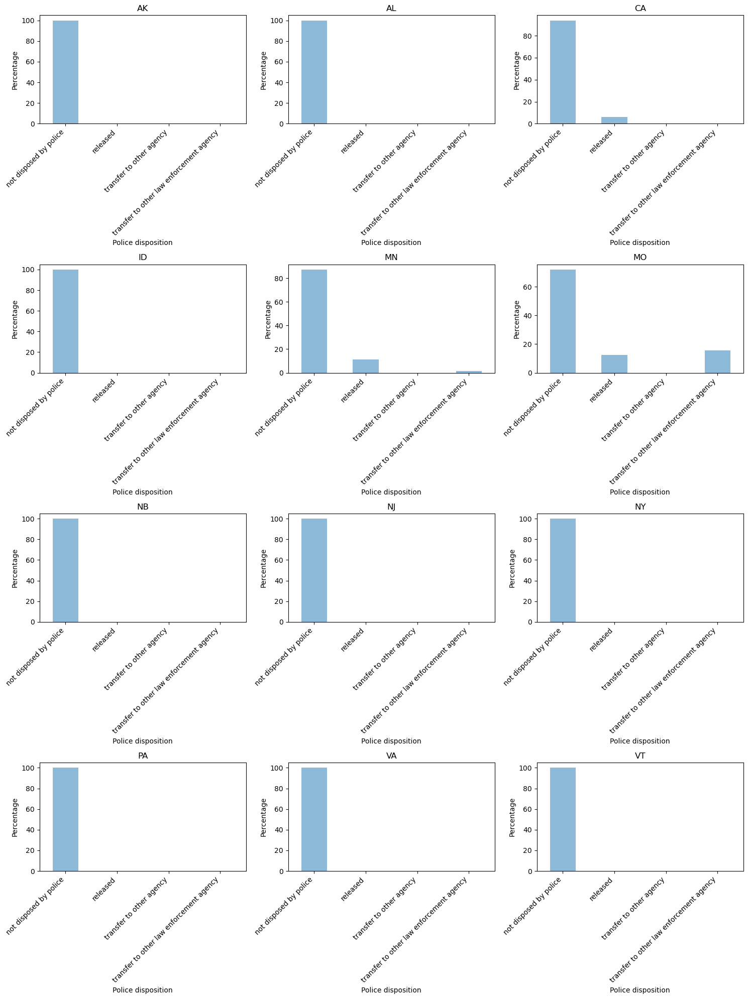

In [62]:
data_copy['police_disposition'] = pd.Categorical(data_copy['police_disposition'])

states = data_copy['state'].unique()

num_cols = 3
num_rows = len(states) // num_cols + (len(states) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, state in enumerate(states):
    row = i // num_cols
    col = i % num_cols
    
    state_data = data_copy[data_copy['state'] == state]
    count_by_value = state_data.groupby('police_disposition').size()
    percent_by_value = count_by_value / count_by_value.sum() * 100
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    percent_by_value.plot(kind='bar', alpha=0.5, ax=ax)
    
    ax.set_title(f"{state}")
    ax.set_xlabel('Police disposition')
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(labels=percent_by_value.index, rotation=45, ha='right')
    
    plt.tight_layout()

plt.show()

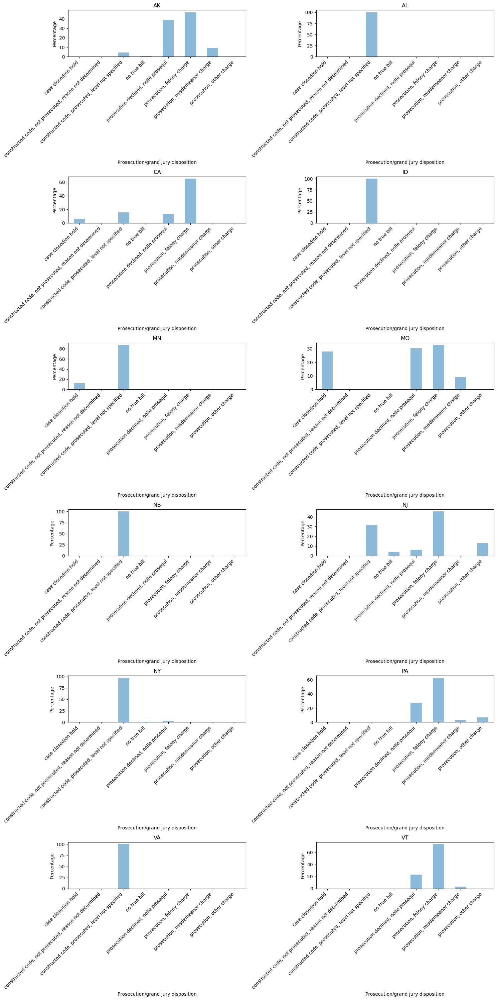

In [63]:
data_copy['prosec_grand_jury_disposition'] = pd.Categorical(data_copy['prosec_grand_jury_disposition'])

states = data_copy['state'].unique()

num_cols = 2
num_rows = len(states) // num_cols + (len(states) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, state in enumerate(states):
    row = i // num_cols
    col = i % num_cols
    
    state_data = data_copy[data_copy['state'] == state]
    count_by_value = state_data.groupby('prosec_grand_jury_disposition').size()
    percent_by_value = count_by_value / count_by_value.sum() * 100
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    percent_by_value.plot(kind='bar', alpha=0.5, ax=ax)
    
    ax.set_title(f"{state}")
    ax.set_xlabel('Prosecution/grand jury disposition')
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(labels=percent_by_value.index, rotation=45, ha='right')
    
    plt.tight_layout()

plt.show()

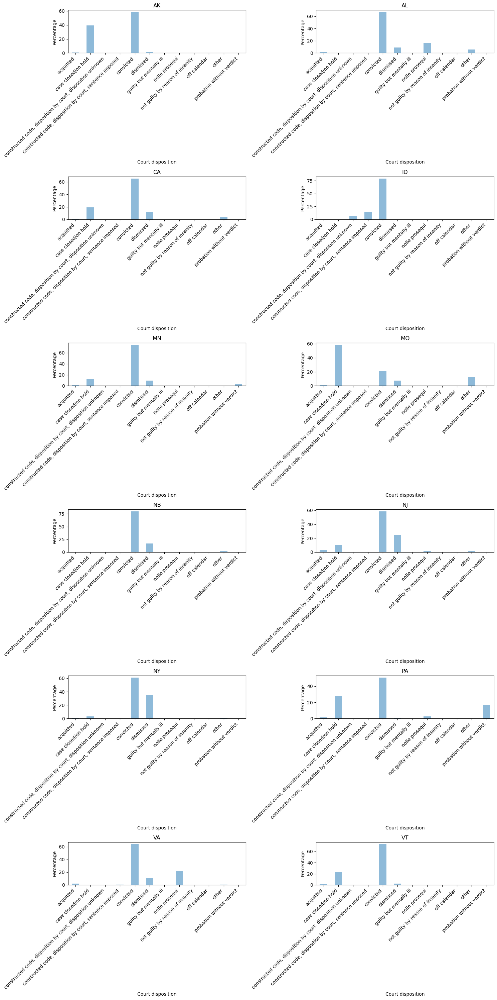

In [64]:
data_copy['court_disposition'] = pd.Categorical(data_copy['court_disposition'])

states = data_copy['state'].unique()

num_cols = 2 
num_rows = len(states) // num_cols + (len(states) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

for i, state in enumerate(states):
    row = i // num_cols
    col = i % num_cols
    
    state_data = data_copy[data_copy['state'] == state]
    count_by_value = state_data.groupby('court_disposition').size()
    percent_by_value = count_by_value / count_by_value.sum() * 100
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    percent_by_value.plot(kind='bar', alpha=0.5, ax=ax)
    
    ax.set_title(f"{state}")
    ax.set_xlabel('Court disposition')
    ax.set_ylabel('Percentage')
    ax.set_xticklabels(labels=percent_by_value.index, rotation=45, ha='right')

    
    plt.tight_layout()

plt.show()


In [43]:
data = pd.read_csv('https://www.dropbox.com/s/fe2xmlqpal1igcx/obts_recoded.csv?dl=1').drop('Unnamed: 0', axis=1)
# !pip install pandas_profiling

from pandas_profiling import ProfileReport
# ProfileReport(data)


/var/folders/p9/d79c5zx13b377v_v34ldc8zh0000gn/T/ipykernel_85808/3691713036.py:1: DtypeWarning: Columns (4,6,22,23,24,25,26,30,31,32,33,34,36,38,39,40,41,42,47,48,51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('https://www.dropbox.com/s/fe2xmlqpal1igcx/obts_recoded.csv?dl=1').drop('Unnamed: 0', axis=1)


In [44]:
data

,age_at_arrest,sex,race,ethnic_origin,incident_number,encrypted_id_number,state,arresting_agency_county,sub_county_code,year_of_arrest,...,sentencing_type,years_of_sentencing_min,months_of_sentencing_min,days_of_sentencing_min,years_of_sentencing_max,months_of_sentencing_max,days_of_sentencing_max,multiple_incar_sentence,year_disposition_determined,state_code
0,67.0,male,NaN,NaN,NaN,VVWIIK779274,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001
1,25.0,NaN,NaN,NaN,NaN,UCQRBF359793,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001
2,40.0,NaN,NaN,NaN,NaN,HTHMWC509187,AK,Anchorage,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-001
3,27.0,NaN,NaN,NaN,NaN,XJLXLX379698,AK,Alaska State Troopers,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-AST
4,25.0,NaN,NaN,NaN,NaN,SQXRBF358795,AK,Unknown,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,AK-999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736841,59.0,female,NaN,NaN,NaN,100000040643,VT,Dept of Pub Sfty Waterbury VT,NaN,1989,...,fine with prison or jail sentence suspended,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-VSP
736842,28.0,male,NaN,NaN,NaN,100000011009,VT,Unknown,NaN,1990,...,"jail, with or without fine",0,0,15,0,0,30,two or more consecutive sentences,1990,VT-999
736843,20.0,male,NaN,NaN,NaN,100000041557,VT,Windsor,NaN,1989,...,sentencing deferred,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,not sentenced to incarceration,no prison or jail sentence,1990,VT-014
736844,43.0,male,NaN,NaN,NaN,100000040435,VT,Windsor,NaN,1990,...,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,case closed/on hold,VT-014


In [45]:
profile = ProfileReport(data, explorative=True)
profile.to_file("OBTS_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/julia_patsiukova/opt/anaconda3/lib/python3.9/site-packages/pandas_profiling/model/correlations.py:67: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/pandas-profiling/issues
(include the error message: 'No data; `observed` has size 0.')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
profile

In [13]:
pd.to_numeric(data['elapsed_time_final_court_disp'], errors='coerce').mean()

190.7519146289313

In [15]:
pd.to_numeric(data['elapsed_time_final_court_disp'], errors='coerce').std()

276.9923332703005

In [16]:
pd.to_numeric(data['elapsed_time_of_sentencing_date'], errors='coerce').mean()

183.16791171599857

In [17]:
pd.to_numeric(data['elapsed_time_of_sentencing_date'], errors='coerce').std()

245.21456576233066

In [69]:
grouped_df = data.groupby('state').size().reset_index(name='count')
grouped_df = grouped_df.sort_values('count', ascending=False)
print(grouped_df)

   state   count
2     CA  251465
8     NY  185104
9     PA  105839
7     NJ   60260
10    VA   48729
5     MO   30344
1     AL   27508
4     MN   12362
6     NB    7984
0     AK    3649
11    VT    2440
3     ID    1162


In [70]:
grouped_df = data.groupby('state_code').size().reset_index(name='count')
grouped_df = grouped_df.sort_values('count', ascending=False)
print(grouped_df)

    state_code  count
92      CA-019  80740
478     NY-023  43591
485     NY-030  43441
517     NY-062  29960
110     CA-037  24635
..         ...    ...
383     NB-031      1
378     NB-025      1
232     MN-067      1
352     MO-108      1
312     MO-061      1

[735 rows x 2 columns]


In [68]:
grouped_df['count'].max()

80740

In [71]:
data.ethnic_origin.value_counts()

non-hispanic    131799
hispanic         51535
Name: ethnic_origin, dtype: int64

In [86]:
(data['ethnic_origin'].isnull().sum() / len(data['ethnic_origin'])) * 100

75.11908865624567

In [89]:
data[data['state'] == 'NY']['ethnic_origin'].isnull().mean() * 100

1.5375140461578356

In [92]:
na_percentages = data.groupby('state').apply(lambda x: x.isna().mean())
print(na_percentages)

       Unnamed: 0  age_at_arrest       sex      race  ethnic_origin  \
state                                                                 
AK            0.0       0.006577  0.930392  0.979446       1.000000   
AL            0.0       0.000000  0.000000  0.000000       1.000000   
CA            0.0       0.000000  0.000386  0.027904       1.000000   
ID            0.0       0.000000  0.000000  0.000000       1.000000   
MN            0.0       0.000000  0.000000  0.001861       1.000000   
MO            0.0       0.000000  0.000000  0.000000       1.000000   
NB            0.0       0.000000  0.000000  0.000125       1.000000   
NJ            0.0       0.000000  0.000000  0.038832       1.000000   
NY            0.0       0.000000  0.000022  0.015375       0.015375   
PA            0.0       0.078884  0.044199  0.097025       0.989834   
VA            0.0       0.000000  0.000000  0.002504       1.000000   
VT            0.0       0.000820  0.003279  1.000000       1.000000   

     

In [93]:
na_percentages.to_excel('na_percentages.xlsx')


In [95]:
na_percentages_all = data.isna().mean()
na_percentages_all.to_excel('na_percentages_all.xlsx')